**KEY POINTS**

*  Used pre-trained vgg19, vgg16 and deepdream model
*  Tried experimenting with resnets as well, but results were suboptimal
* An key improvement would be to use multiple images to accurately guage style of the artist.
* In such a case using resnets will be most optimal, but due to time constraints doing this was not possible.
* If using resnets, training the model from scratch using nearly all paintings of the particular artist will be ideal.
* HyperParameter tuning in submitted model might still be sub-optimal and maybe more experimentations can lead to a better results.

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.utils import save_image
import torch
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.utils import save_image
from torchvision.models import inception_v3
import matplotlib.pyplot as plt

In [6]:
model = models.vgg19(pretrained=True).features

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 74.6MB/s]


In [7]:
class VGG(nn.Module):
  def __init__(self):
    super(VGG,self).__init__()
    self.chosen_features = ['0', '5', '10', '15', '20', '25', '30', '35']
    self.model = models.vgg19(pretrained = True).features[:20]

  def forward(self, x):
    features = []

    for layer_num, layer in enumerate(self.model):
      x = layer(x)
      if str(layer_num) in self.chosen_features:
        features.append(x)

    return features

In [8]:
def load_image(image_name):
  image = Image.open(image_name)
  image = loader(image).unsqueeze(0)
  return image.to(device)


Epoch 0/6000, Total Loss: 878759.5


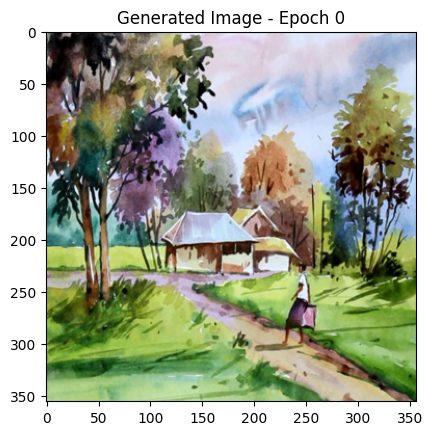

Epoch 200/6000, Total Loss: 38276.5


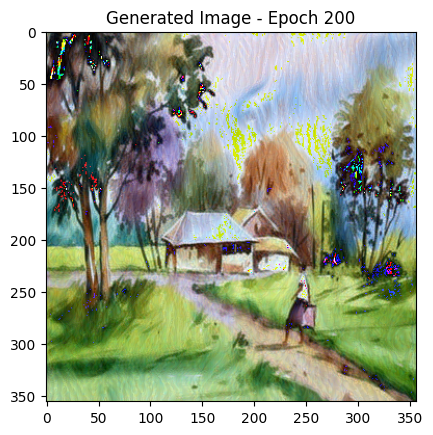

Epoch 400/6000, Total Loss: 18423.33984375


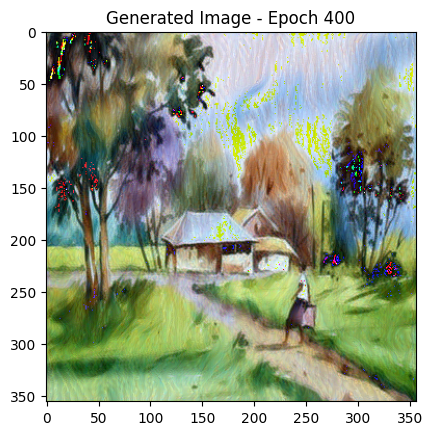

Epoch 600/6000, Total Loss: 11520.3173828125


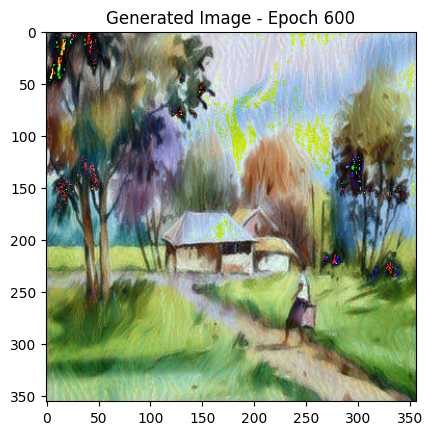

Epoch 800/6000, Total Loss: 8028.294921875


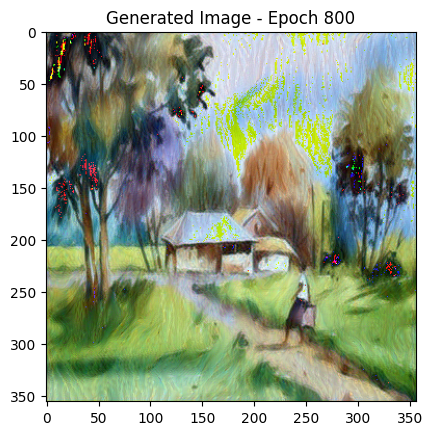

Epoch 1000/6000, Total Loss: 5948.74609375


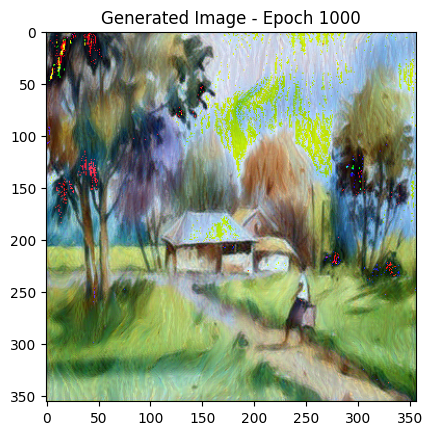

Epoch 1200/6000, Total Loss: 4624.13916015625


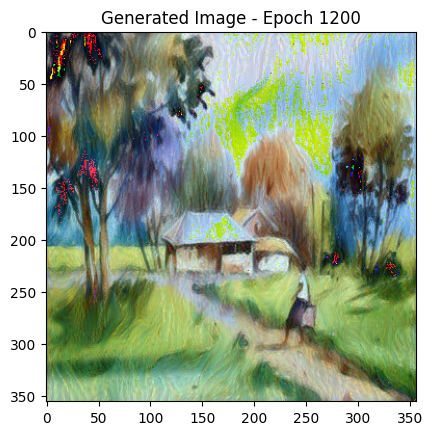

Epoch 1400/6000, Total Loss: 3748.008056640625


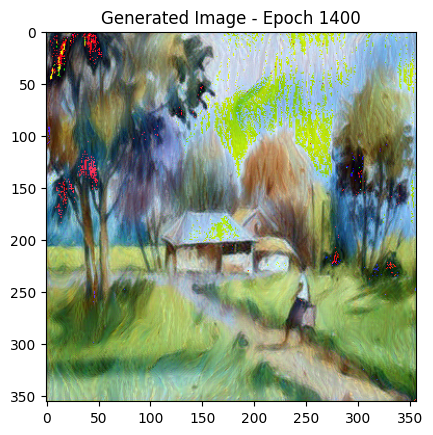

Epoch 1600/6000, Total Loss: 3139.831298828125


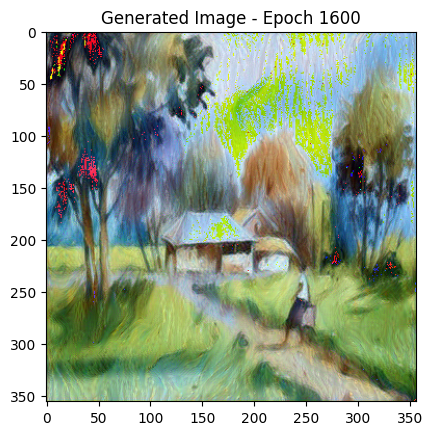

Epoch 1800/6000, Total Loss: 2693.369140625


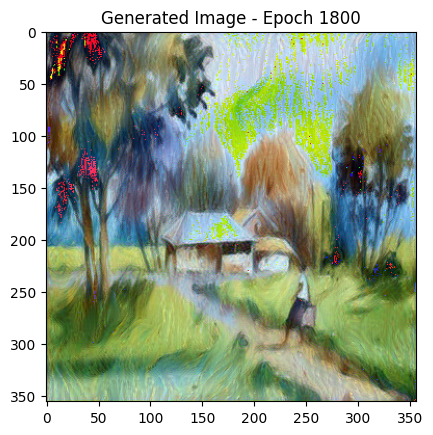

Epoch 2000/6000, Total Loss: 2347.584716796875


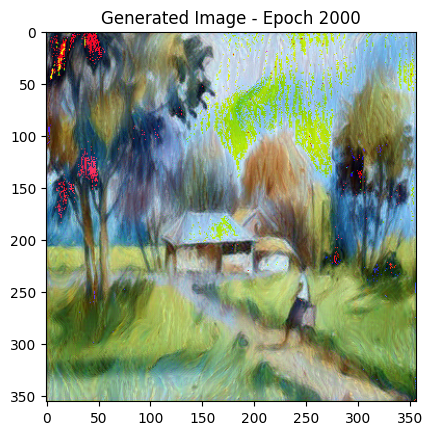

Epoch 2200/6000, Total Loss: 2068.96728515625


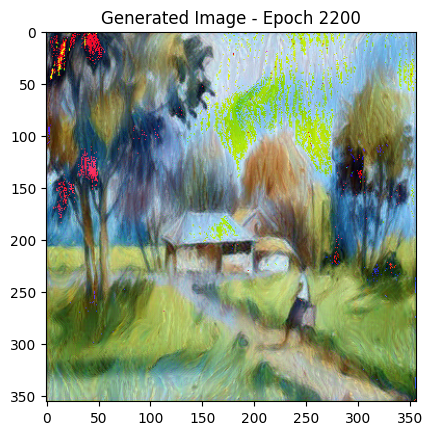

Epoch 2400/6000, Total Loss: 1839.933349609375


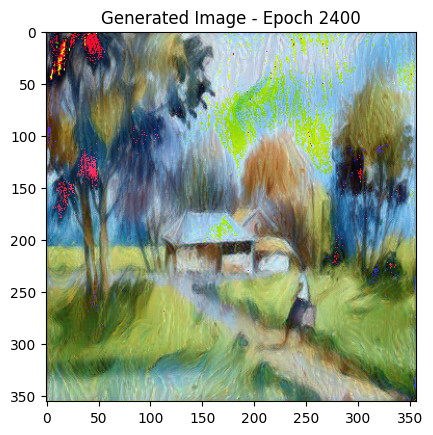

Epoch 2600/6000, Total Loss: 1649.19921875


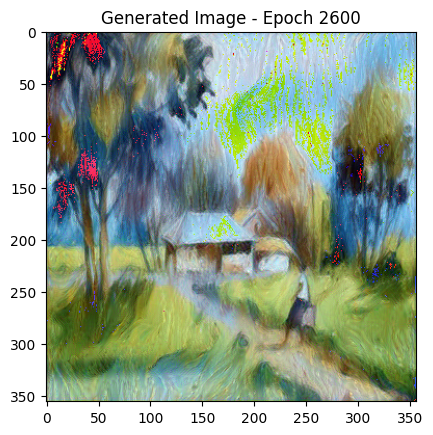

Epoch 2800/6000, Total Loss: 1488.1488037109375


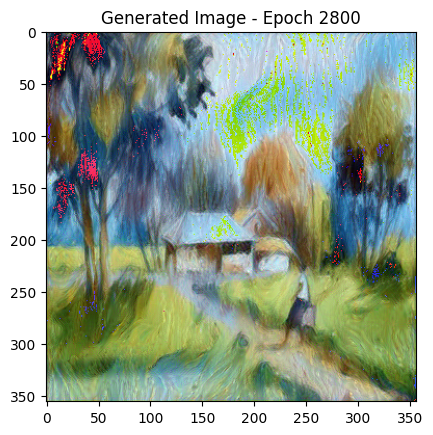

Epoch 3000/6000, Total Loss: 1350.1173095703125


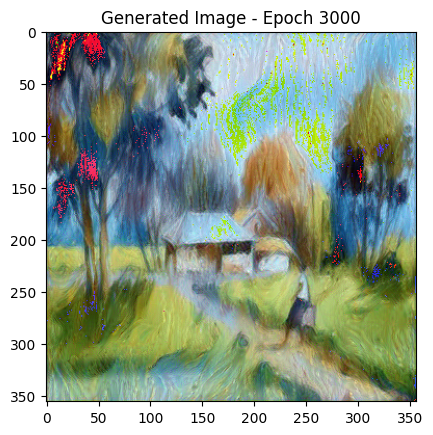

Epoch 3200/6000, Total Loss: 1230.45361328125


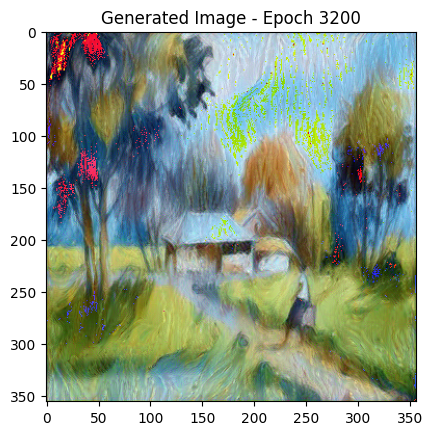

Epoch 3400/6000, Total Loss: 1125.3359375


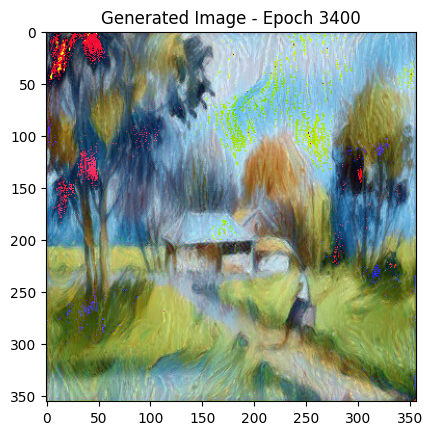

Epoch 3600/6000, Total Loss: 1032.4578857421875


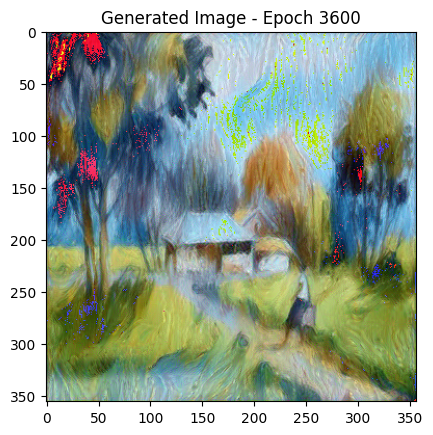

Epoch 3800/6000, Total Loss: 949.9994506835938


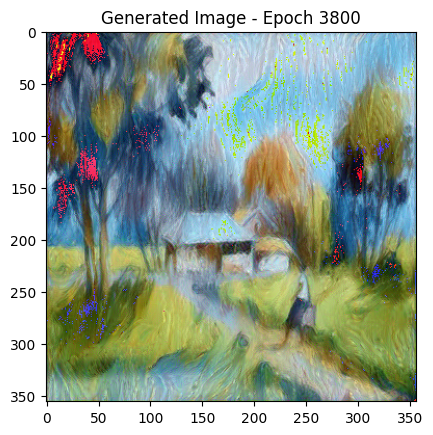

Epoch 4000/6000, Total Loss: 876.5553588867188


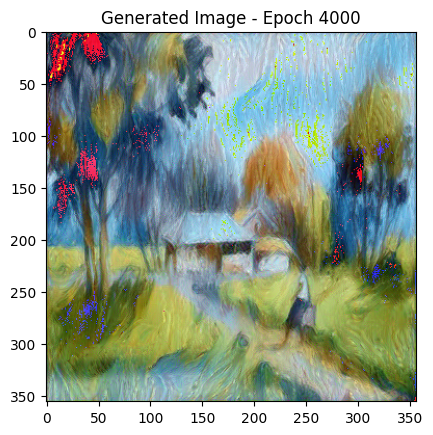

Epoch 4200/6000, Total Loss: 810.85791015625


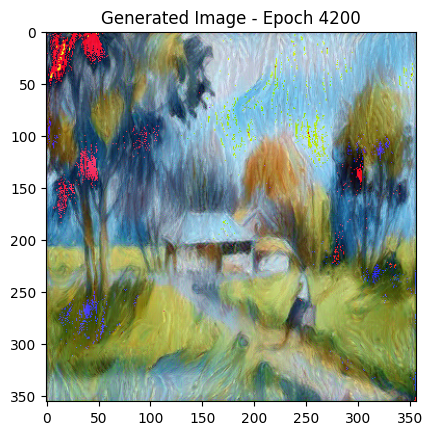

Epoch 4400/6000, Total Loss: 751.5012817382812


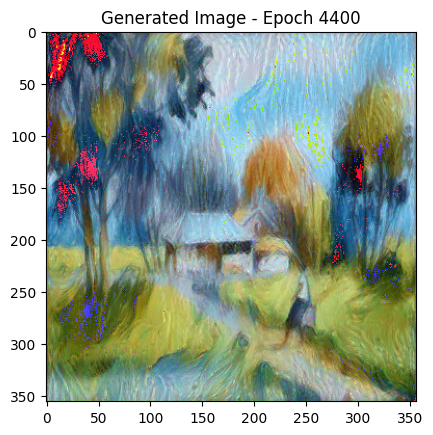

Epoch 4600/6000, Total Loss: 697.8192138671875


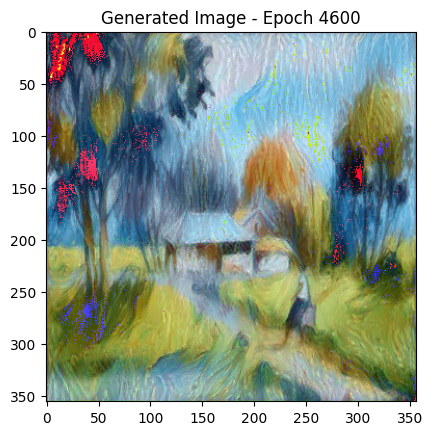

Epoch 4800/6000, Total Loss: 651.2991333007812


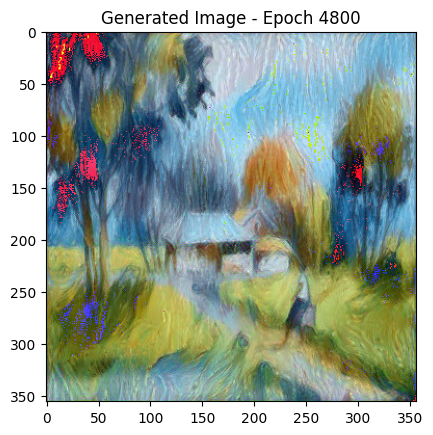

Epoch 5000/6000, Total Loss: 607.2493286132812


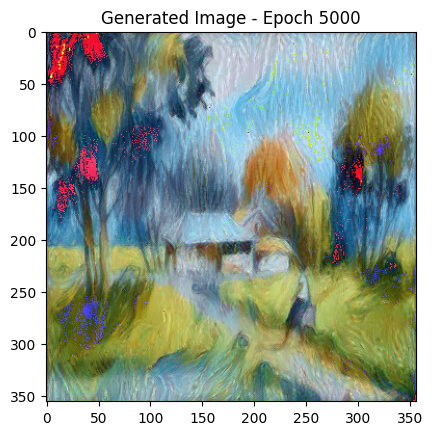

Epoch 5200/6000, Total Loss: 566.5989379882812


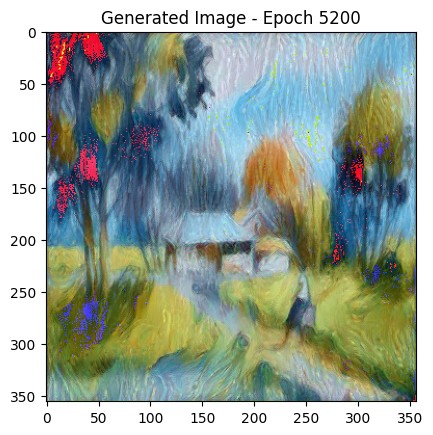

Epoch 5400/6000, Total Loss: 540.3851928710938


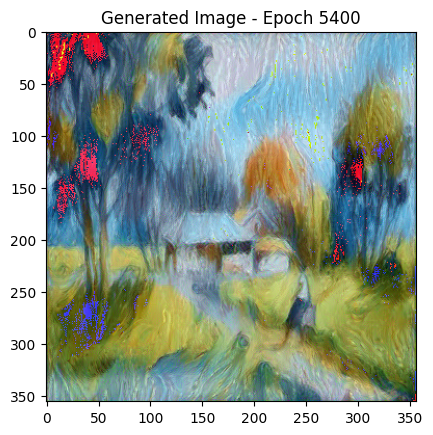

Epoch 5600/6000, Total Loss: 498.34521484375


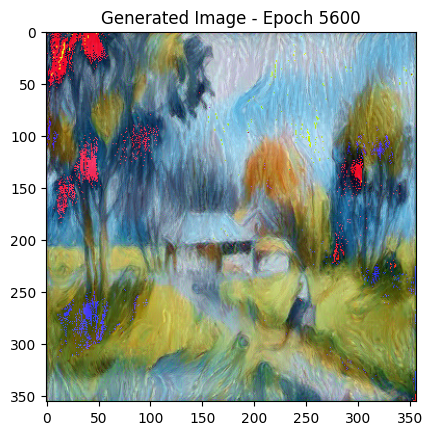

Epoch 5800/6000, Total Loss: 468.01385498046875


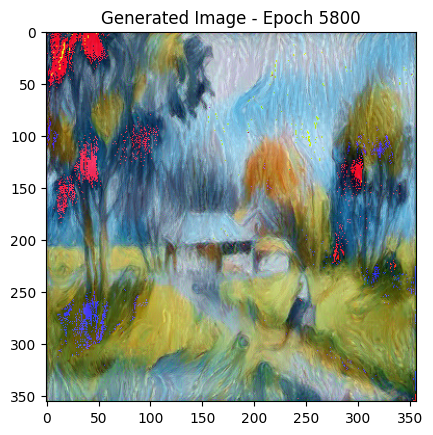

In [27]:
# Import necessary libraries
import torch
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.utils import save_image
# from model import VGG  # Assuming you have a VGG model defined in 'model.py'
# from utils import load_image  # Assuming you have a function to load images in 'utils.py'
import matplotlib.pyplot as plt

# Set device to GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set the size for resizing images
image_size = 356

# Define a transformation pipeline for loading and processing images
loader = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # Resize images to a square of size image_size x image_size
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    # transforms.Normalize(mean=[], std=[])  # If normalization is needed, it can be added here
])

# Load original and style images using the defined loader
original_img = load_image("/content/aquire.jpg")
style_img = load_image("/content/von.jpeg")

# Initialize the VGG model and move it to the specified device (GPU or CPU)
model = VGG().to(device).eval()

# Clone the original image for generation and set requires_grad to True for backpropagation
generated = original_img.clone().requires_grad_(True)

# Set hyperparameters for the training process
total_steps = 6000
learning_rate = 0.001
alpha = 1
beta = 0.01

# Initialize the Adam optimizer for updating the generated image
optimizer = optim.Adam([generated], lr=learning_rate)

# Training loop
for step in range(total_steps):
    # Forward pass to get features from the VGG model for the generated, original, and style images
    generated_features = model(generated)
    original_img_features = model(original_img)
    style_features = model(style_img)

    # Loss calculation
    style_loss = original_loss = 0

    # Calculate the content loss (original_loss)
    for gen_feature, orig_feature, style_feature in zip(
            generated_features, original_img_features, style_features
    ):
        batch_size, channel, height, width = gen_feature.shape
        original_loss += torch.mean((gen_feature - orig_feature) ** 2)

        # Compute Gram Matrix for style loss
        G = gen_feature.view(channel, height * width).mm(
            gen_feature.view(channel, height * width).t()
        )

        A = style_feature.view(channel, height * width).mm(
            style_feature.view(channel, height * width).t()
        )

        # Calculate the style loss
        style_loss += torch.mean((G - A) ** 2)

    # Total loss is a combination of content and style loss with respective weights (alpha and beta)
    total_loss = alpha * original_loss + beta * style_loss

    # Backward pass and optimization
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # Print and save results every 200 epochs
    if step % 200 == 0:
        print(f"Epoch {step}/{total_steps}, Total Loss: {total_loss.item()}")

        # Save the generated image
        save_image(generated, f"generated_epoch_{step}.png")

        # Visualize the generated image
        plt.imshow(transforms.ToPILImage()(generated.squeeze().cpu()))
        plt.title(f'Generated Image - Epoch {step}')
        plt.show()


Epoch 0/600, Dream Loss: -0.011667607352137566


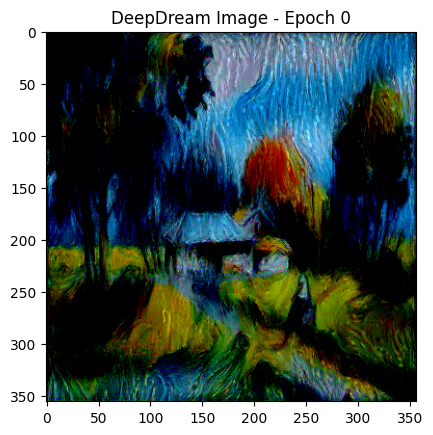

Epoch 200/600, Dream Loss: -0.09542819112539291


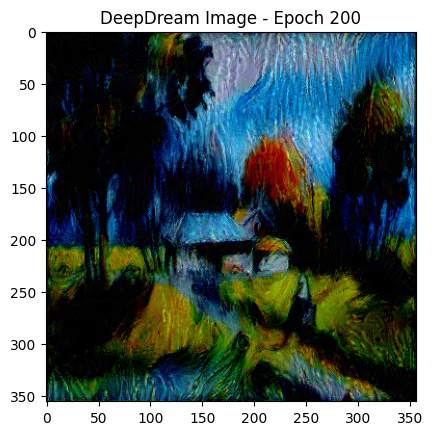

Epoch 400/600, Dream Loss: -0.11134938895702362


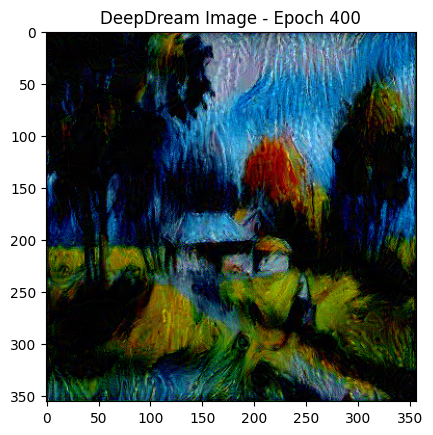

In [30]:
# Set device to GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set the size for resizing images
image_size = 356

# Define a transformation pipeline for loading and processing images
loader = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Load original image using the defined loader
original_img = load_image("/content/generated_epoch_5800.png")

# Clone the original image for generation and set requires_grad to True for backpropagation
generated = original_img.clone().requires_grad_(True)

# Set hyperparameters for the training process
total_steps = 600
learning_rate = 0.0005
dream_strength = 0.2 # Adjust the strength of the dream effect

# Initialize the Adam optimizer for updating the generated image
optimizer = optim.Adam([generated], lr=learning_rate)

# Load the style image
style_img = load_image("/content/von.jpeg")

# Define the architecture for the DeepDream model
class DeepDreamModel(torch.nn.Module):
    def __init__(self, model, target_layer):
        super(DeepDreamModel, self).__init__()
        self.features = torch.nn.Sequential(*list(model.children())[:target_layer + 1])

    def forward(self, x):
        return self.features(x)

# Instantiate the Inception V3 model
inception_model = inception_v3(pretrained=True).to(device).eval()

# Instantiate the DeepDream model with the Inception V3 features up to a specific layer
deepdream_model = DeepDreamModel(inception_model, target_layer=15).to(device)

# Training loop
for step in range(total_steps):
    # Forward pass to get the features from the DeepDream model
    deepdream_features = deepdream_model(generated)

    # Loss calculation
    dream_loss = torch.mean(deepdream_features)

    # Backward pass and optimization
    optimizer.zero_grad()
    dream_loss.backward()
    optimizer.step()

    # Apply gradient ascent to the generated image
    with torch.no_grad():
        generated += dream_strength * generated.grad
        generated.grad.zero_()

    # Clip the pixel values to be in the valid range [0, 1]
    generated.data.clamp_(0, 1)

    # Print and save results every 200 epochs
    if step % 200 == 0:
        print(f"Epoch {step}/{total_steps}, Dream Loss: {dream_loss.item()}")

        # Save the generated image
        save_image(generated, f"deepdream_generated_epoch_{step}.png")

        # Visualize the generated image
        plt.imshow(transforms.ToPILImage()(generated.squeeze().cpu()))
        plt.title(f'DeepDream Image - Epoch {step}')
        plt.show()
